In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


## LOADING  HOUSING PRICE DATASET

In [4]:
from sklearn.datasets import fetch_openml

In [5]:
housing = fetch_openml(name="house_prices", as_frame=True)

C:\Users\Swetha\anaconda3\lib\site-packages\sklearn\datasets\_openml.py:932: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


In [7]:
housing.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

In [8]:
print(housing.DESCR)

Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1

In [9]:
print(housing.data)

        Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0        1          60       RL         65.0     8450   Pave  None      Reg   
1        2          20       RL         80.0     9600   Pave  None      Reg   
2        3          60       RL         68.0    11250   Pave  None      IR1   
3        4          70       RL         60.0     9550   Pave  None      IR1   
4        5          60       RL         84.0    14260   Pave  None      IR1   
...    ...         ...      ...          ...      ...    ...   ...      ...   
1455  1456          60       RL         62.0     7917   Pave  None      Reg   
1456  1457          20       RL         85.0    13175   Pave  None      Reg   
1457  1458          70       RL         66.0     9042   Pave  None      Reg   
1458  1459          20       RL         68.0     9717   Pave  None      Reg   
1459  1460          20       RL         75.0     9937   Pave  None      Reg   

     LandContour Utilities  ... ScreenPorch PoolAre

In [10]:
print(housing.target)

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64


In [11]:
print(housing.feature_names)

['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC'

## preparing the dataset

In [12]:
dataset = pd.DataFrame(housing.data)

In [13]:
dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,0,None,None,None,0,2,2008,WD,Normal
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,0,None,None,None,0,5,2007,WD,Normal
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,0,None,None,None,0,9,2008,WD,Normal
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,0,None,None,None,0,2,2006,WD,Abnorml
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,0,None,None,None,0,12,2008,WD,Normal


In [14]:
dataset.shape

(1460, 80)

In [15]:
dataset['Price'] = housing.target

In [16]:
dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,12,2008,WD,Normal,250000


In [17]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## to check missing values

In [19]:
dataset['Alley'].value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

In [20]:
dataset['Alley'].isnull().sum()

1369

In [22]:
# since this column has alot of null values we will delete this column
dataset.drop('Alley',axis=1,inplace=True)

In [23]:
dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,...,0,None,None,None,0,12,2008,WD,Normal,250000


In [24]:
dataset['LotFrontage'].isnull().sum()

259

In [30]:
dataset['LotFrontage'][5:50]

5      85.0
6      75.0
7       NaN
8      51.0
9      50.0
10     70.0
11     85.0
12      NaN
13     91.0
14      NaN
15     51.0
16      NaN
17     72.0
18     66.0
19     70.0
20    101.0
21     57.0
22     75.0
23     44.0
24      NaN
25    110.0
26     60.0
27     98.0
28     47.0
29     60.0
30     50.0
31      NaN
32     85.0
33     70.0
34     60.0
35    108.0
36    112.0
37     74.0
38     68.0
39     65.0
40     84.0
41    115.0
42      NaN
43      NaN
44     70.0
45     61.0
46     48.0
47     84.0
48     33.0
49     66.0
Name: LotFrontage, dtype: float64

In [32]:
# for this column we can assign the median to  the null values because
# the missing values are random


In [37]:
dataset2 = dataset.copy()

In [38]:
dataset2['LotFrontage'].fillna(dataset2['LotFrontage'].median(),inplace=True)

In [39]:
dataset2['LotFrontage'].isnull().sum()

0

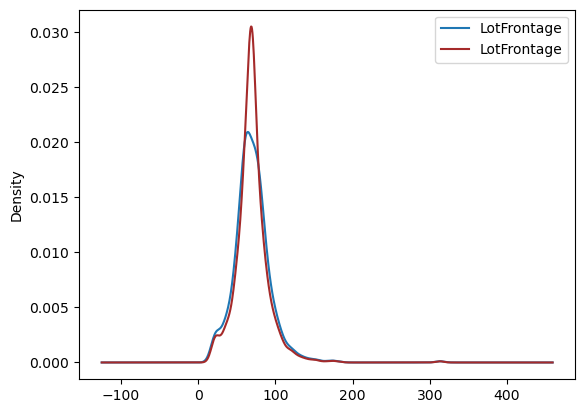

In [40]:
fig=plt.figure()
ax= fig.add_subplot(111)
dataset['LotFrontage'].plot(kind='kde',ax=ax)
dataset2['LotFrontage'].plot(kind='kde',ax=ax,color='brown')
lines,labels=ax.get_legend_handles_labels()
ax.legend(lines,labels,loc='best')

In [41]:
dataset2['MasVnrType'].isnull().sum()

8

In [42]:
dataset2['MasVnrArea'].isnull().sum()

8

In [43]:
dataset2[dataset2['MasVnrType'].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
234,235,60,RL,69.0,7851,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2010,WD,Normal,216500
529,530,20,RL,69.0,32668,Pave,IR1,Lvl,AllPub,CulDSac,...,0,None,None,None,0,3,2007,WD,Alloca,200624
650,651,60,FV,65.0,8125,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2008,WD,Normal,205950
936,937,20,RL,67.0,10083,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,8,2009,WD,Normal,184900
973,974,20,FV,95.0,11639,Pave,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,12,2008,New,Partial,182000
977,978,120,FV,35.0,4274,Pave,IR1,Lvl,AllPub,Inside,...,0,None,None,None,0,11,2007,New,Partial,199900
1243,1244,20,RL,107.0,13891,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,9,2006,New,Partial,465000
1278,1279,60,RL,75.0,9473,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,3,2008,WD,Normal,237000


In [44]:
dataset2[dataset2['MasVnrArea'].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
234,235,60,RL,69.0,7851,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2010,WD,Normal,216500
529,530,20,RL,69.0,32668,Pave,IR1,Lvl,AllPub,CulDSac,...,0,None,None,None,0,3,2007,WD,Alloca,200624
650,651,60,FV,65.0,8125,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2008,WD,Normal,205950
936,937,20,RL,67.0,10083,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,8,2009,WD,Normal,184900
973,974,20,FV,95.0,11639,Pave,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,12,2008,New,Partial,182000
977,978,120,FV,35.0,4274,Pave,IR1,Lvl,AllPub,Inside,...,0,None,None,None,0,11,2007,New,Partial,199900
1243,1244,20,RL,107.0,13891,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,9,2006,New,Partial,465000
1278,1279,60,RL,75.0,9473,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,3,2008,WD,Normal,237000


In [49]:
dataset2['MasVnrArea'].value_counts().sort_values()

123.0      1
64.0       1
481.0      1
651.0      1
333.0      1
        ... 
120.0      7
108.0      8
72.0       8
180.0      8
0.0      861
Name: MasVnrArea, Length: 327, dtype: int64

In [50]:
dataset2['MasVnrArea'].mean()

103.68526170798899

In [51]:
dataset2['MasVnrArea'].median()

0.0

In [52]:
dataset2['MasVnrArea'].mode()

0    0.0
Name: MasVnrArea, dtype: float64

In [53]:
# we can compute mean for this column

In [54]:
dataset2['MasVnrArea'].fillna(dataset2['MasVnrArea'].mean(),inplace=True)

In [55]:
dataset2['MasVnrArea'].isnull().sum()

0

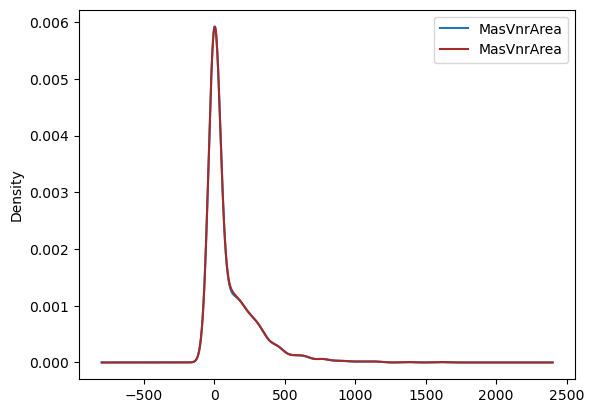

In [56]:
fig=plt.figure()
ax= fig.add_subplot(111)
dataset['MasVnrArea'].plot(kind='kde',ax=ax)
dataset2['MasVnrArea'].plot(kind='kde',ax=ax,color='brown')
lines,labels=ax.get_legend_handles_labels()
ax.legend(lines,labels,loc='best')

In [61]:
dataset2['MasVnrType'].fillna("unknown",inplace=True)

In [62]:
dataset2['MasVnrType'].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
unknown      8
Name: MasVnrType, dtype: int64

In [63]:
dataset2['BsmtQual'].isnull().sum()

37

In [64]:
dataset2['BsmtCond'].isnull().sum()

37

In [65]:
dataset2[dataset2['BsmtCond'].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
17,18,90,RL,72.0,10791,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,Shed,500,10,2006,WD,Normal,90000
39,40,90,RL,65.0,6040,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2008,WD,AdjLand,82000
90,91,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,7,2006,WD,Normal,109900
102,103,90,RL,64.0,7018,Pave,Reg,Bnk,AllPub,Inside,...,0,None,None,None,0,6,2009,WD,Alloca,118964
156,157,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2006,WD,Normal,109500
182,183,20,RL,60.0,9060,Pave,Reg,Lvl,AllPub,Inside,...,0,None,MnPrv,None,0,6,2007,WD,Normal,120000
259,260,20,RM,70.0,12702,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,12,2008,WD,Normal,97000
342,343,90,RL,69.0,8544,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2006,WD,Normal,87500
362,363,85,RL,64.0,7301,Pave,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,7,2009,ConLD,Normal,198500
371,372,50,RL,80.0,17120,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,7,2008,WD,Normal,134432


In [66]:
dataset2[dataset2['BsmtQual'].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
17,18,90,RL,72.0,10791,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,Shed,500,10,2006,WD,Normal,90000
39,40,90,RL,65.0,6040,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2008,WD,AdjLand,82000
90,91,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,7,2006,WD,Normal,109900
102,103,90,RL,64.0,7018,Pave,Reg,Bnk,AllPub,Inside,...,0,None,None,None,0,6,2009,WD,Alloca,118964
156,157,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2006,WD,Normal,109500
182,183,20,RL,60.0,9060,Pave,Reg,Lvl,AllPub,Inside,...,0,None,MnPrv,None,0,6,2007,WD,Normal,120000
259,260,20,RM,70.0,12702,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,12,2008,WD,Normal,97000
342,343,90,RL,69.0,8544,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2006,WD,Normal,87500
362,363,85,RL,64.0,7301,Pave,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,7,2009,ConLD,Normal,198500
371,372,50,RL,80.0,17120,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,7,2008,WD,Normal,134432


In [67]:
dataset2['BsmtQual'].value_counts()


TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [68]:
dataset2['BsmtCond'].value_counts()

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [70]:
dataset2[dataset2['BsmtFinType2'].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
17,18,90,RL,72.0,10791,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,Shed,500,10,2006,WD,Normal,90000
39,40,90,RL,65.0,6040,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2008,WD,AdjLand,82000
90,91,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,7,2006,WD,Normal,109900
102,103,90,RL,64.0,7018,Pave,Reg,Bnk,AllPub,Inside,...,0,None,None,None,0,6,2009,WD,Alloca,118964
156,157,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,6,2006,WD,Normal,109500
182,183,20,RL,60.0,9060,Pave,Reg,Lvl,AllPub,Inside,...,0,None,MnPrv,None,0,6,2007,WD,Normal,120000
259,260,20,RM,70.0,12702,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,12,2008,WD,Normal,97000
332,333,20,RL,85.0,10655,Pave,IR1,Lvl,AllPub,Inside,...,0,None,None,None,0,10,2009,WD,Normal,284000
342,343,90,RL,69.0,8544,Pave,Reg,Lvl,AllPub,Inside,...,0,None,None,None,0,5,2006,WD,Normal,87500
362,363,85,RL,64.0,7301,Pave,Reg,Lvl,AllPub,Corner,...,0,None,None,None,0,7,2009,ConLD,Normal,198500


## for columns 'BsmtQual', 'BsmtCond', 'BsmtFinType1','BsmtFinType2' --> these columns have same rows with null values so we can remove them 

In [76]:
dataset2.dropna(subset=['BsmtQual'],inplace=True)

In [79]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1423 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1423 non-null   int64  
 1   MSSubClass     1423 non-null   int64  
 2   MSZoning       1423 non-null   object 
 3   LotFrontage    1423 non-null   float64
 4   LotArea        1423 non-null   int64  
 5   Street         1423 non-null   object 
 6   LotShape       1423 non-null   object 
 7   LandContour    1423 non-null   object 
 8   Utilities      1423 non-null   object 
 9   LotConfig      1423 non-null   object 
 10  LandSlope      1423 non-null   object 
 11  Neighborhood   1423 non-null   object 
 12  Condition1     1423 non-null   object 
 13  Condition2     1423 non-null   object 
 14  BldgType       1423 non-null   object 
 15  HouseStyle     1423 non-null   object 
 16  OverallQual    1423 non-null   int64  
 17  OverallCond    1423 non-null   int64  
 18  YearBuil

In [80]:
# since the columns 'poolQc', 'Fence', 'MiscFeature' contains less values so we can drop those columns

In [81]:
dataset2.drop(columns=['PoolQC', 'Fence', 'MiscFeature'],axis=1,inplace = True)

In [82]:
dataset2.shape

(1423, 77)

In [83]:
dataset2['FireplaceQu'].value_counts()

Gd    376
TA    310
Fa     33
Ex     23
Po     19
Name: FireplaceQu, dtype: int64

In [84]:
dataset2['FireplaceQu'].isnull().sum()

662

In [85]:
# the null values are huge here as well so we will delete this column 

In [86]:
dataset2.drop(columns=['FireplaceQu'],axis=1,inplace = True)

In [87]:
dataset2.shape

(1423, 76)

In [88]:
dataset2['GarageType'].isnull().sum()

74

In [90]:
dataset2['GarageYrBlt'].isnull().sum()

74

In [91]:
dataset2[dataset2['GarageType'].isnull()][:10]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
48,49,190,RM,33.0,4456,Pave,Reg,Lvl,AllPub,Inside,...,102,0,0,0,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,4,2010,WD,Normal,136500
88,89,50,C (all),105.0,8470,Pave,IR1,Lvl,AllPub,Corner,...,156,0,0,0,0,10,2009,ConLD,Abnorml,85000
89,90,20,RL,60.0,8070,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,400,1,2010,WD,Normal,128950
108,109,50,RM,85.0,8500,Pave,Reg,Lvl,AllPub,Corner,...,144,0,0,0,0,8,2007,WD,Normal,115000
125,126,190,RM,60.0,6780,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,6,2006,WD,Normal,84500
127,128,45,RM,55.0,4388,Pave,IR1,Bnk,AllPub,Inside,...,0,0,0,0,0,6,2007,WD,Normal,87000
140,141,20,RL,70.0,10500,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,4,2010,ConLI,Normal,115000
148,149,20,RL,63.0,7500,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,4,2008,WD,Normal,141000


In [92]:
dataset2[dataset2['GarageYrBlt'].isnull()][:10]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
48,49,190,RM,33.0,4456,Pave,Reg,Lvl,AllPub,Inside,...,102,0,0,0,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,4,2010,WD,Normal,136500
88,89,50,C (all),105.0,8470,Pave,IR1,Lvl,AllPub,Corner,...,156,0,0,0,0,10,2009,ConLD,Abnorml,85000
89,90,20,RL,60.0,8070,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,8,2007,WD,Normal,123600
99,100,20,RL,77.0,9320,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,400,1,2010,WD,Normal,128950
108,109,50,RM,85.0,8500,Pave,Reg,Lvl,AllPub,Corner,...,144,0,0,0,0,8,2007,WD,Normal,115000
125,126,190,RM,60.0,6780,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,6,2006,WD,Normal,84500
127,128,45,RM,55.0,4388,Pave,IR1,Bnk,AllPub,Inside,...,0,0,0,0,0,6,2007,WD,Normal,87000
140,141,20,RL,70.0,10500,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,4,2010,ConLI,Normal,115000
148,149,20,RL,63.0,7500,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,4,2008,WD,Normal,141000


In [93]:
# the rows are similar with columns having null values we will remove those rows

In [94]:
dataset2.dropna(subset=['GarageYrBlt'],inplace=True)

In [96]:
dataset2.shape

(1349, 76)

In [97]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1349 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1349 non-null   int64  
 1   MSSubClass     1349 non-null   int64  
 2   MSZoning       1349 non-null   object 
 3   LotFrontage    1349 non-null   float64
 4   LotArea        1349 non-null   int64  
 5   Street         1349 non-null   object 
 6   LotShape       1349 non-null   object 
 7   LandContour    1349 non-null   object 
 8   Utilities      1349 non-null   object 
 9   LotConfig      1349 non-null   object 
 10  LandSlope      1349 non-null   object 
 11  Neighborhood   1349 non-null   object 
 12  Condition1     1349 non-null   object 
 13  Condition2     1349 non-null   object 
 14  BldgType       1349 non-null   object 
 15  HouseStyle     1349 non-null   object 
 16  OverallQual    1349 non-null   int64  
 17  OverallCond    1349 non-null   int64  
 18  YearBuil

In [98]:
dataset2.dropna(subset=['BsmtFinType2'],inplace=True)

In [101]:
dataset2.dropna(subset=['Electrical'],inplace=True)

In [103]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1347 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1347 non-null   int64  
 1   MSSubClass     1347 non-null   int64  
 2   MSZoning       1347 non-null   object 
 3   LotFrontage    1347 non-null   float64
 4   LotArea        1347 non-null   int64  
 5   Street         1347 non-null   object 
 6   LotShape       1347 non-null   object 
 7   LandContour    1347 non-null   object 
 8   Utilities      1347 non-null   object 
 9   LotConfig      1347 non-null   object 
 10  LandSlope      1347 non-null   object 
 11  Neighborhood   1347 non-null   object 
 12  Condition1     1347 non-null   object 
 13  Condition2     1347 non-null   object 
 14  BldgType       1347 non-null   object 
 15  HouseStyle     1347 non-null   object 
 16  OverallQual    1347 non-null   int64  
 17  OverallCond    1347 non-null   int64  
 18  YearBuil

## now we have data with no null values

In [104]:
# lets check correlation 
dataset2.corr()

C:\Users\Swetha\AppData\Local\Temp\ipykernel_45900\2096112676.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  dataset2.corr()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Price
Id,1.000000,0.016186,-0.012156,-0.036380,-0.039230,0.011158,-0.020625,-0.025738,-0.050916,-0.003029,...,-0.034298,0.001135,0.003173,-0.043915,0.000307,0.059170,-0.002378,0.022673,-0.000502,-0.026828
MSSubClass,0.016186,1.000000,-0.360055,-0.135967,0.049690,-0.095739,0.055939,0.038203,0.031326,-0.069273,...,-0.010081,-0.000954,-0.024202,-0.041165,-0.022364,0.010262,-0.021368,-0.016046,-0.021541,-0.081115
LotFrontage,-0.012156,-0.360055,1.000000,0.297502,0.227961,-0.043455,0.101583,0.078235,0.175504,0.217728,...,0.069189,0.145522,0.015122,0.063834,0.031654,0.185353,-0.002274,0.014556,0.010361,0.329512
LotArea,-0.036380,-0.135967,0.297502,1.000000,0.089952,-0.002316,-0.006357,0.000374,0.096547,0.210830,...,0.166385,0.083377,-0.013068,0.019154,0.038086,0.076817,0.040648,-0.002369,-0.013726,0.253861
OverallQual,-0.039230,0.049690,0.227961,0.089952,1.000000,-0.164025,0.571843,0.550568,0.399336,0.199992,...,0.216939,0.313551,-0.118178,0.025756,0.043622,0.063926,-0.029648,0.064121,-0.017040,0.784525
OverallCond,0.011158,-0.095739,-0.043455,-0.002316,-0.164025,1.000000,-0.416340,0.033491,-0.140586,-0.064151,...,-0.011549,-0.062028,0.066656,0.024235,0.054822,-0.003219,0.077450,-0.010466,0.057323,-0.109932
YearBuilt,-0.020625,0.055939,0.101583,-0.006357,0.571843,-0.416340,1.000000,0.619467,0.298317,0.223482,...,0.210308,0.220624,-0.386096,0.028183,-0.072209,0.000581,-0.033873,0.006510,-0.007981,0.504003
YearRemodAdd,-0.025738,0.038203,0.078235,0.000374,0.550568,0.033491,0.619467,1.000000,0.167792,0.099795,...,0.199271,0.234303,-0.220165,0.038702,-0.053812,0.002976,-0.001810,0.016727,0.034128,0.501074
MasVnrArea,-0.050916,0.031326,0.175504,0.096547,0.399336,-0.140586,0.298317,0.167792,1.000000,0.251514,...,0.148910,0.128104,-0.111882,0.015229,0.052482,0.009340,-0.028967,-0.013655,-0.001711,0.463416
BsmtFinSF1,-0.003029,-0.069273,0.217728,0.210830,0.199992,-0.064151,0.223482,0.099795,0.251514,1.000000,...,0.185805,0.111102,-0.101784,0.026336,0.050821,0.141805,0.007587,-0.019704,0.022226,0.362055


In [105]:
sns.pairplot(dataset2)

Text(0, 0.5, 'Price')

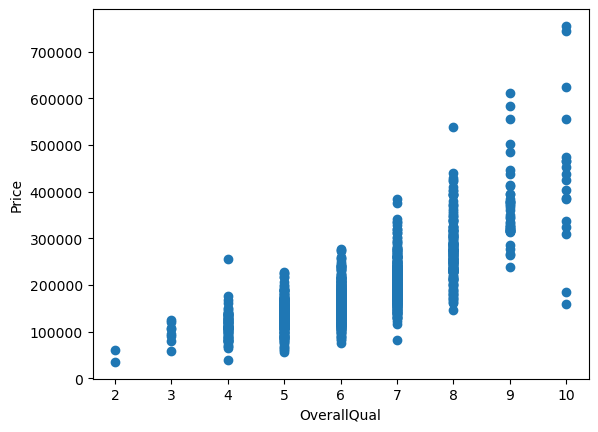

In [106]:
plt.scatter(dataset2['OverallQual'],dataset2['Price'])
plt.xlabel("OverallQual")
plt.ylabel("Price")

<Axes: xlabel='OverallQual', ylabel='Price'>

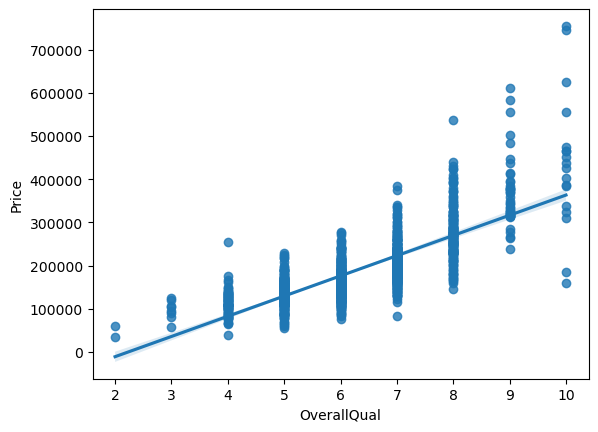

In [107]:
sns.regplot(x='OverallQual',y='Price',data=dataset2)

## feature engineering

In [108]:
## independent and dependent features

In [135]:
num_columns = []
cat_columns =[]
for i in dataset2.columns:
    if dataset[i].dtypes == 'O':
        cat_columns.append(i)
    else:
        num_columns.append(i)

In [123]:
num_columns

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'Price']

In [136]:
cat_columns

['MSZoning',
 'Street',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

## encoding for categorical features

In [137]:
for col in cat_columns:
    print(col,": ",len(X_train[col].unique())," labels")

MSZoning :  5  labels
Street :  2  labels
LotShape :  4  labels
LandContour :  4  labels
LotConfig :  5  labels
LandSlope :  3  labels
Neighborhood :  25  labels
Condition1 :  9  labels
Condition2 :  6  labels
BldgType :  5  labels
HouseStyle :  8  labels
RoofStyle :  6  labels
RoofMatl :  6  labels
Exterior1st :  12  labels
Exterior2nd :  14  labels
MasVnrType :  5  labels
ExterQual :  4  labels
ExterCond :  4  labels
Foundation :  5  labels
BsmtQual :  4  labels
BsmtCond :  4  labels
BsmtExposure :  5  labels
BsmtFinType1 :  6  labels
BsmtFinType2 :  6  labels
Heating :  3  labels
HeatingQC :  5  labels
CentralAir :  2  labels
Electrical :  5  labels
KitchenQual :  4  labels
Functional :  7  labels
GarageType :  6  labels
GarageFinish :  3  labels
GarageQual :  5  labels
GarageCond :  4  labels
PavedDrive :  3  labels
SaleType :  9  labels
SaleCondition :  6  labels


In [128]:
dataset2['Utilities'].value_counts()

AllPub    1346
NoSeWa       1
Name: Utilities, dtype: int64

In [129]:
dataset2.drop('Utilities',axis=1,inplace=True)

In [130]:
dataset2.shape

(1347, 75)

In [139]:
dataset2['Street'].value_counts()

Pave    1342
Grvl       5
Name: Street, dtype: int64

In [140]:
dataset3 = dataset2.copy()
for feature in cat_columns:
    labels_ordered=dataset2.groupby([feature])['Price'].mean().sort_values().index
    labels_ordered={k:i for i,k in enumerate(labels_ordered,0)}
    dataset3[feature]=dataset3[feature].map(labels_ordered)

In [142]:
dataset3.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Price
0,1,60,3,65.0,8450,1,0,1,0,0,...,0,0,0,0,0,2,2008,4,3,208500
1,2,20,3,80.0,9600,1,0,1,1,0,...,0,0,0,0,0,5,2007,4,3,181500
2,3,60,3,68.0,11250,1,1,1,0,0,...,0,0,0,0,0,9,2008,4,3,223500
3,4,70,3,60.0,9550,1,1,1,2,0,...,272,0,0,0,0,2,2006,4,2,140000
4,5,60,3,84.0,14260,1,1,1,1,0,...,0,0,0,0,0,12,2008,4,3,250000
5,6,50,3,85.0,14115,1,1,1,0,0,...,0,320,0,0,700,10,2009,4,3,143000
6,7,20,3,75.0,10084,1,0,1,0,0,...,0,0,0,0,0,8,2007,4,3,307000
7,8,60,3,69.0,10382,1,1,1,2,0,...,228,0,0,0,350,11,2009,4,3,200000
8,9,50,2,51.0,6120,1,0,1,0,0,...,205,0,0,0,0,4,2008,4,2,129900
9,10,190,3,50.0,7420,1,0,1,2,0,...,0,0,0,0,0,1,2008,4,3,118000


In [164]:
X=dataset3.iloc[:,:-1]
y = dataset3.iloc[:,-1]

## train test split

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=21)

In [165]:
X_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1414,1415,50,3,64.0,13053,1,0,0,0,0,...,0,0,0,220,0,0,6,2008,4,3
589,590,40,2,50.0,9100,1,0,1,0,0,...,0,0,0,0,0,600,8,2008,4,3
141,142,20,3,78.0,11645,1,0,1,0,0,...,24,0,0,0,0,0,1,2006,4,3
1010,1011,50,3,115.0,21286,1,0,1,0,0,...,0,108,0,0,0,0,8,2008,4,3
404,405,60,3,69.0,10364,1,1,1,0,0,...,40,0,0,0,0,0,5,2007,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,404,60,3,93.0,12090,1,0,1,2,0,...,123,0,0,0,0,0,7,2006,4,2
51,52,50,2,52.0,6240,1,0,1,0,0,...,0,0,0,0,0,400,9,2006,4,3
837,838,160,2,21.0,1680,1,0,1,0,0,...,0,0,0,0,0,0,11,2008,4,3
1336,1337,90,3,87.0,9246,1,1,1,0,0,...,211,0,0,0,0,0,11,2008,4,3


In [166]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [167]:
X_train = scaler.fit_transform(X_train)

In [168]:
X_train

array([[ 1.64175659, -0.16703024,  0.23047805, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [-0.32846388, -0.40724778, -1.70800695, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [-1.3983533 , -0.88768287,  0.23047805, ..., -1.36348503,
        -0.20103627, -0.12955835],
       ...,
       [ 0.26379633,  2.4753627 , -1.70800695, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [ 1.4554812 ,  0.79383992,  0.23047805, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [ 0.78441217, -0.88768287,  0.23047805, ...,  0.15114103,
        -2.57814299, -1.59996762]])

In [169]:
X_test = scaler.transform(X_test)

In [170]:
X_test

array([[-0.1636818 , -0.16703024,  0.23047805, ...,  1.66576709,
        -0.20103627, -1.59996762],
       [ 1.49607969, -0.16703024,  0.23047805, ...,  1.66576709,
        -0.20103627, -0.12955835],
       [ 0.33544072, -0.88768287,  0.23047805, ..., -0.606172  ,
        -0.20103627, -0.12955835],
       ...,
       [ 0.56709088,  0.0731873 ,  0.23047805, ...,  1.66576709,
        -0.20103627, -0.12955835],
       [ 1.04472009,  0.55362238,  0.23047805, ..., -0.606172  ,
        -0.20103627, -0.12955835],
       [-0.03711007, -0.16703024, -5.58497696, ...,  1.66576709,
        -0.20103627, -1.59996762]])

## Model Training

In [152]:
from sklearn.linear_model import LinearRegression
regression = LinearRegression()

In [160]:
regression.fit(X_train,y_train)

ValueError: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [173]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')

In [175]:
X_train = imp.fit_transform(X_train)

In [176]:
X_train

array([[ 1.64175659, -0.16703024,  0.23047805, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [-0.32846388, -0.40724778, -1.70800695, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [-1.3983533 , -0.88768287,  0.23047805, ..., -1.36348503,
        -0.20103627, -0.12955835],
       ...,
       [ 0.26379633,  2.4753627 , -1.70800695, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [ 1.4554812 ,  0.79383992,  0.23047805, ...,  0.15114103,
        -0.20103627, -0.12955835],
       [ 0.78441217, -0.88768287,  0.23047805, ...,  0.15114103,
        -2.57814299, -1.59996762]])

In [177]:
X_test = imp.transform(X_test)

In [178]:
regression.fit(X_train,y_train)

LinearRegression()

In [179]:
## print coefficients and intercepts

print(regression.coef_)

[ 5.38767505e+02 -7.01714519e+03 -1.91498855e+03  7.36647694e+02
 -4.25138886e+02  8.93893985e+01  1.35552901e+03  1.47751065e+03
  2.93480878e+02  3.80290589e+01  1.27403800e+04  8.29017590e+02
 -4.28103362e+03 -2.97028358e+03 -1.20925340e+03  1.11025852e+04
  4.90289445e+03 -3.80816465e+03 -4.65645239e+01  1.14077979e+03
  4.68079516e+03 -1.90821064e+03  9.98369502e+02 -3.72710695e+02
  2.92995263e+03  3.48699452e+03  2.20881854e+03  6.10395083e+02
  4.78646732e+03  8.70130302e+02  4.26929517e+03  2.10940917e+02
  1.48481966e+15  1.50621105e+03  5.59958985e+14  1.47910165e+15
 -1.29277436e+15 -1.36277272e+03  1.43478669e+03  1.68440796e+03
 -1.29484107e+03  1.40555219e+16  1.63153127e+16  1.55604852e+15
 -1.90312019e+16 -2.39516939e+01  3.97580012e+02  3.32816819e+02
  1.92957516e+03 -4.69088317e+03 -5.93067241e+03  7.07748488e+03
  8.33219872e+03  2.83678214e+03  3.19337476e+03 -5.73141041e+02
 -3.05232285e+02 -5.35523006e+02  2.03802497e+03  5.10500269e+03
  2.60227072e+03 -6.42382

In [181]:
print(regression.intercept_)

187393.25831815388


In [182]:
## on which parameters model has been train 
regression.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

In [183]:
# prediction

y_pred = regression.predict(X_test)

In [184]:
y_pred

array([134038.51145558, 380848.96211311, 107407.7340894 , 129992.33096548,
        82269.67536589, 194208.92993636,  98145.73755934, 277137.09648471,
       202208.69658961, 126773.57874424, 218080.60190915, 284941.909872  ,
       275601.0031094 , 160644.66656696, 255140.26343194, 197908.31816073,
       270387.616768  , 125347.43656355, 323393.54624669, 221283.53043752,
       160329.7556489 , 147406.32000353, 196229.70733169, 266105.13417196,
       200943.52372311, 139246.01160592, 215452.93814286, 134818.75386202,
       133748.33448382,  81737.47063749, 175470.55793276, 127839.22760281,
       193030.03835263, 121386.06556325,  91690.69209408, 127195.1588143 ,
       311043.22595507, 277393.79891894, 255110.89054095, 152112.65295333,
       196547.49337779, 113640.01330001, 130788.85016252, 303020.02047658,
       132168.8243843 ,  78502.13822726, 227761.08230165, 100695.29749837,
       136634.09536161, 204149.04999565, 309850.60432079, 188189.0712596 ,
        64628.2199761 , 1

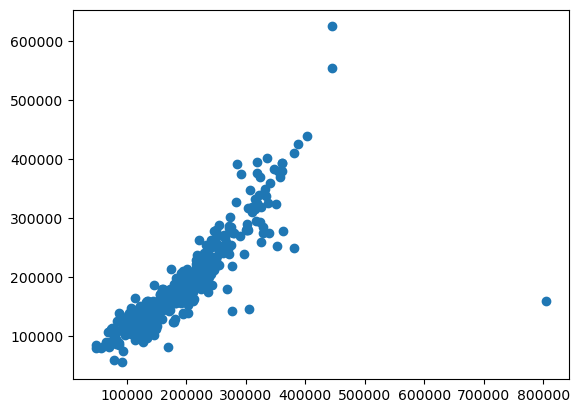

In [185]:
# plot scatter plot for prediction

plt.scatter(y_pred,y_test)

In [186]:
# prediction with resoduals

residuals = y_test - y_pred

In [187]:
residuals

658    -36538.511456
1353    29151.037887
867     21592.265911
303     19907.669035
352     12730.324634
            ...     
245     11859.453451
1186   -27161.963775
964    -19567.467680
1164   -19815.277910
711    -42400.682585
Name: Price, Length: 405, dtype: float64

C:\Users\Swetha\AppData\Local\Temp\ipykernel_45900\2773949289.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(residuals)


<Axes: xlabel='Price', ylabel='Density'>

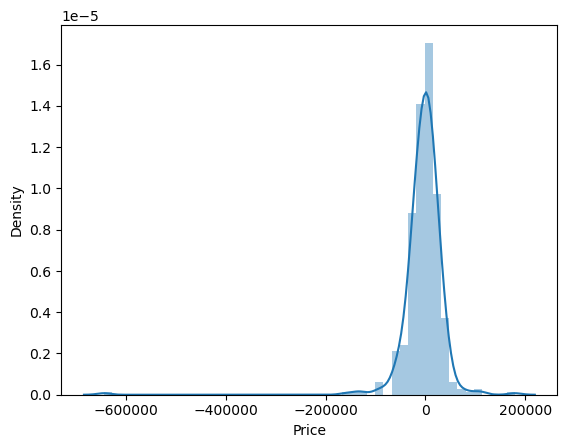

In [190]:
## plot this residuals
sns.distplot(residuals)

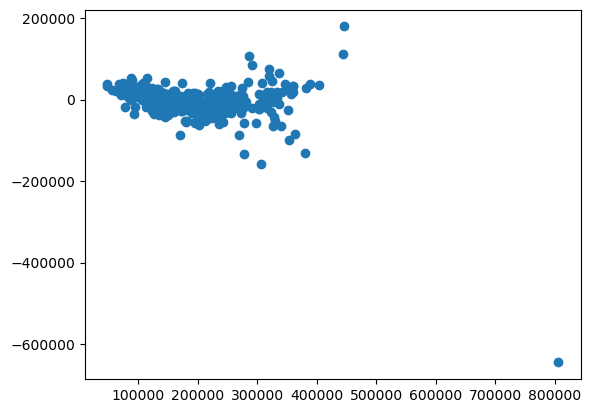

In [192]:
# scatter plot with respect to prediction and residuals

plt.scatter(y_pred,residuals)

# if the points are uniformly distributed between predicted value and residuals , then the model is performing well

In [194]:
# performance matrics

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

print(mean_absolute_error(y_test,y_pred))
print(mean_squared_error(y_test,y_pred))
print(np.sqrt(mean_squared_error(y_test,y_pred)))

22767.35910239508
1955541450.3681643
44221.50438834215


# r square and adjusted r square

r2 = 1-ssr/sst

r2 ==> coefficient of determination
ssr ==> sum of square of residuals
sst ==> total sum of square

In [195]:
from sklearn.metrics import r2_score
score = r2_score(y_test,y_pred)
print(score)
# the more score is towards 1 the better the model in prediction

0.6777140544834086


In [196]:
# adjusted r2

1 - (1-score)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)

0.6054438727615062

In [197]:
# always the adjusted r2 will be less that r2

# New data Prediction

In [221]:
data1 = scaler.transform(dataset3.iloc[:1,:-1]).reshape(1,-1)

In [222]:
data1

array([[-1.73508189,  0.0731873 ,  0.23047805, -0.22159642, -0.23935987,
         0.05652334, -0.68082125, -0.1178434 , -0.56546936, -0.22183374,
         0.56654055,  0.17241348,  0.02765711,  0.3666013 ,  0.85737339,
         0.56866434, -0.55024199,  0.99108092,  0.83451659, -0.50561719,
        -0.10080193,  0.99044717,  1.00088114,  0.44938067,  0.45476673,
         0.95165978,  0.32531213,  1.00880648,  0.56428476, -0.05239515,
        -0.62503731,  0.99612912,  0.57341444,  0.18919684, -0.28408971,
        -1.00733028, -0.61697189,  0.10630481,  0.84881573,  0.20782052,
         0.238502  , -0.83213377,  1.13956029, -0.10340508,  0.35390853,
         1.10852983, -0.22678881,  0.75352747,  1.19259978,  0.19741783,
        -0.15519116,  0.6559133 ,  0.92691795,  0.22245012, -1.03426565,
         0.57955565,  0.95984543,  0.21212866,  0.20228862,  0.2759043 ,
         0.12753651,  0.18691945,  0.22718931, -0.78313886,  0.22332651,
        -0.34354013, -0.12325331, -0.29265492, -0.0

In [223]:
regression.predict(data1)

array([219789.25831815])

## Pickling the model file for deployment

In [227]:
import pickle

In [228]:
pickle.dump(regression,open("housingmodel.pkl","wb"))

In [229]:
pickled_model = pickle.load(open("housingmodel.pkl","rb"))

In [230]:
pickled_model.predict(data1)

array([219789.25831815])